In [5]:
import matplotlib.pyplot as plt
import os
import re
from PIL import Image
import pandas as pd 
import ast
import numpy as np 
import json
import glob
import random
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

In [6]:
with open("proteomics_combinations.json", 'r') as file:
	protein_sets = json.load(file)

protein_categories = protein_sets['IPS_pathways']

In [3]:
multimodal_protein_groups = list(protein_categories.keys())

### Get slides predicted correctly for pathologist investigation

In [4]:
from sklearn.metrics import accuracy_score, roc_auc_score

def calculate_accuracy_auc_and_correct_predictions(df, threshold=0.5):
    # Predict 1 if 'p_1' is greater than the threshold, else predict 0
    df['predicted_label'] = (df['p_0'] > threshold).astype(int)

    # Create a new column for correctly predicted samples (1 for correct, 0 for incorrect)
    df['correct_prediction'] = (df['predicted_label'] == df['label']).astype(int)

    # Calculate accuracy
    accuracy = accuracy_score(df['label'], df['predicted_label'])

    # Calculate AUC-ROC
    auc_roc = roc_auc_score(df['label'], df['p_0'])

    return accuracy, auc_roc, df


# switched labels... 

results = pd.read_csv("/mnt/ncshare/ozkilim/BRCA/heatmaps/results/HGSOC_clm_sb_UAB.csv")
# results = results[0:300]
# Calculate accuracy, AUC-ROC and get DataFrame with correct predictions
accuracy, auc_roc, df_with_correct_predictions = calculate_accuracy_auc_and_correct_predictions(results, threshold=0.5)
print("Accuracy:", accuracy)
print("AUC-ROC:", auc_roc)

df_with_correct_predictions[["correct_prediction","slide_id"]]

# 1. why reversed?....
# 2. 

Accuracy: 0.4367816091954023
AUC-ROC: 0.569280343716434


/home/ozkilim/anaconda3/envs/clam/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3331: DtypeWarning: Columns (5286,5287) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,correct_prediction,slide_id
0,0,1009596_269105_ImageActual
1,1,1009617_269126_ImageActual
2,1,1009618_269127_ImageActual
3,1,1009435_171150_ImageActual
4,1,1009609_269118_ImageActual
...,...,...
169,1,1009845_271294_ImageActual
170,0,1009774_271246_ImageActual
171,0,1009802_271273_ImageActual
172,0,1009779_271250_ImageActual


In [5]:
def get_single_png_file(folder_path):
    # Check if the folder path ends with 'mask'
    # List all files in the directory
    files = os.listdir(folder_path)

    # Find the first PNG file
    for file in files:
        if file.endswith("mask.jpg"):
            return os.path.join(folder_path, file)

    print("No PNG file found in the directory.")
    return None


def get_clam_sb_heatmap(folder_path):
    # Check if the folder path ends with 'mask'
    # List all files in the directory
    files = os.listdir(folder_path)

    # Find the first PNG file
    for file in files:
        if file.endswith("_0.png"):
            return os.path.join(folder_path, file)

    print("No clam_sb_heatmap file found in the directory.")
    return None

def find_first_npy_file(folder_path):
    # Create a search pattern for .npy files
    search_pattern = os.path.join(folder_path, '*.npy')

    # List all .npy files in the folder
    npy_files = glob.glob(search_pattern)

    # Return the first .npy file found, or None if there are no such files
    return npy_files[0] if npy_files else None


def format_row_for_title(row):
    # Select the columns you want to include in the title
    columns_of_interest = ["Tumor response", "Tumor type", "Tumor location", "Tumor Grade", "Tumor Stage"]

    # Create a formatted string with bold values
    title_parts = [f"{col}: $\mathbf{{{row[col]}}}$" for col in columns_of_interest if pd.notna(row[col])]
    formatted_title = ", ".join(title_parts)


    return formatted_title



def load_random_png_images(folder_path, num_images=10):
    # List all PNG files in the folder
    all_png_files = [f for f in os.listdir(folder_path) if f.endswith('.png')]
    
    # Randomly sample num_images files
    sampled_files = random.sample(all_png_files, min(num_images, len(all_png_files)))

    # Load images and convert to numpy arrays
    image_arrays = []
    for file in sampled_files:
        img = Image.open(os.path.join(folder_path, file))
        img_array = np.array(img)
        image_arrays.append(img_array)

    return image_arrays


def get_cross_attns(folder_path):
    # Regex pattern to match filenames ending with a number and '.png'
    pattern = re.compile(r'\d\.png$')

    # List to hold the paths of matching files
    matching_files = []

    # Iterate over all files in the folder
    for filename in os.listdir(folder_path):
        # Check if the file is a PNG and ends with a number
        if pattern.search(filename):
            # Add the full path to the list
            full_path = os.path.join(folder_path, filename)
            matching_files.append(full_path)

    return matching_files


def load_patch_png_images(folder_path,image, num_images=3):
    # List all PNG files in the folder
    all_files = os.listdir(folder_path)

    # Filter files that contain the substring and end with '.png'
    image_files = [file for file in all_files if image in file and file.endswith('.png')]

    # Load images
    images = []
    for image_file in image_files:
        img_path = os.path.join(folder_path, image_file)
        img = Image.open(img_path)
        images.append(img)

    return images


def load_patch_png_images_walk(folder_path, image_substring, num_images=15):
    images = []
    
    # Walk through all subdirectories in the folder
    for root, dirs, files in os.walk(folder_path):
        # Filter files that contain the substring and end with '.png'
        image_files = [file for file in files if image_substring in file and file.endswith('.png')]

        # Load images until num_images is reached
        for image_file in image_files:
            if len(images) < num_images:
                img_path = os.path.join(root, image_file)
                img = Image.open(img_path)
                images.append(img)
            else:
                break

    return images

def crop_to_square(img, padding=0):
    """
    Crop the PIL image to make it square with an optional padding.
    Padding will be removed from the top/bottom or left/right edges to make the image square.
    """
    if not isinstance(img, Image.Image):
        raise ValueError("The provided input is not a PIL Image.")

    # Get dimensions
    width, height = img.size

    # Determine the size to crop
    new_size = min(width, height) - 2 * padding

    if new_size <= 0:
        raise ValueError("Padding is too large to make the image square.")

    # Calculate cropping coordinates
    left = (width - new_size) / 2
    top = (height - new_size) / 2
    right = (width + new_size) / 2
    bottom = (height + new_size) / 2

    # Crop the image
    img_cropped = img.crop((left, top, right, bottom))

    img_cropped = make_background_white(img_cropped)

    return img_cropped


def make_background_white(image):
    # Convert the image to grayscale
    gray = image.convert('L')

    # Convert the grayscale image to a numpy array
    gray_np = np.array(gray)

    # Determine a threshold value to separate background and foreground
    # Adjust this threshold to suit your specific image
    threshold = 200  # This might need to be adjusted

    # Create a mask where the background is True (white)
    background_mask = gray_np > threshold

    # Convert the original image to a numpy array
    image_np = np.array(image)

    # Replace the background with white
    image_np[background_mask] = [255, 255, 255]

    # Convert the numpy array back to a PIL image
    return Image.fromarray(image_np)



/home/ozkilim/anaconda3/envs/clam/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3331: DtypeWarning: Columns (7632) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


1009466_171125_ImageActual
15


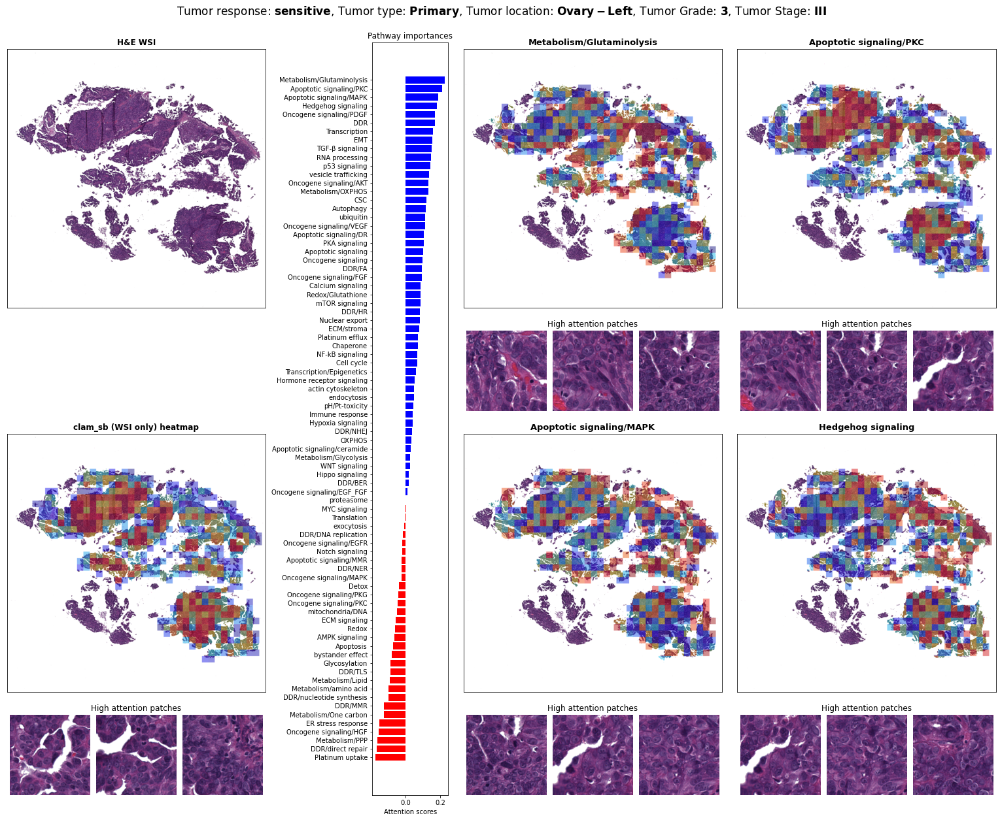

1009467_416633_ImageActual
15


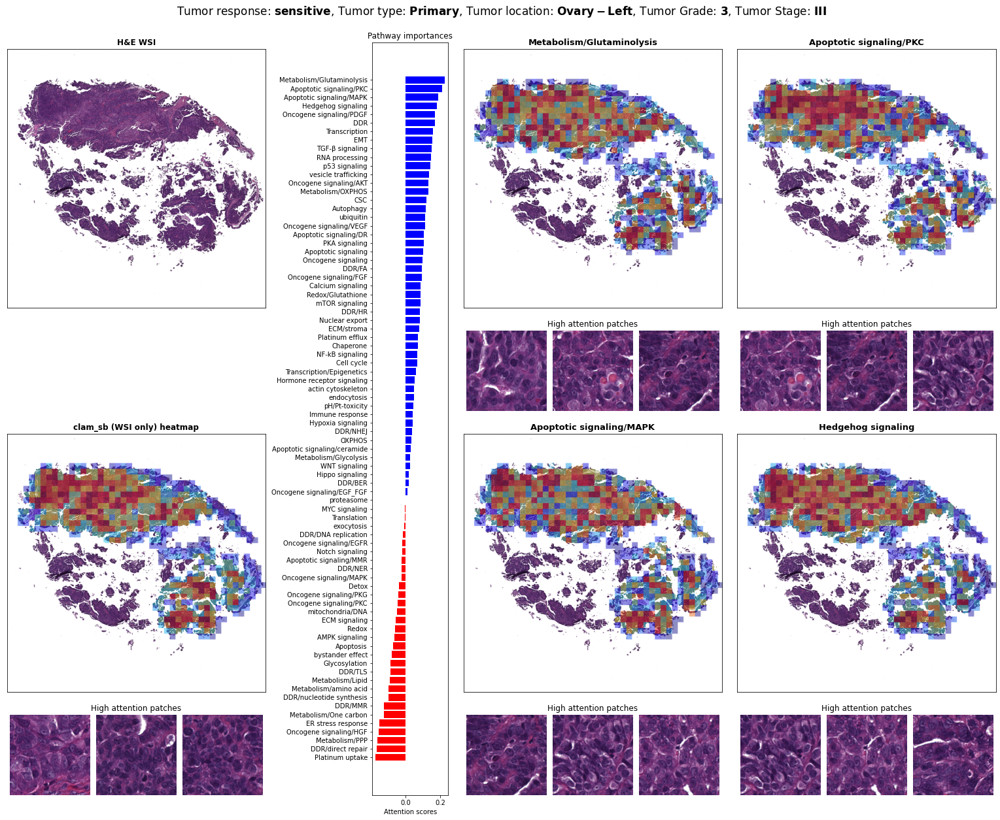

1009790_271240_ImageActual
15


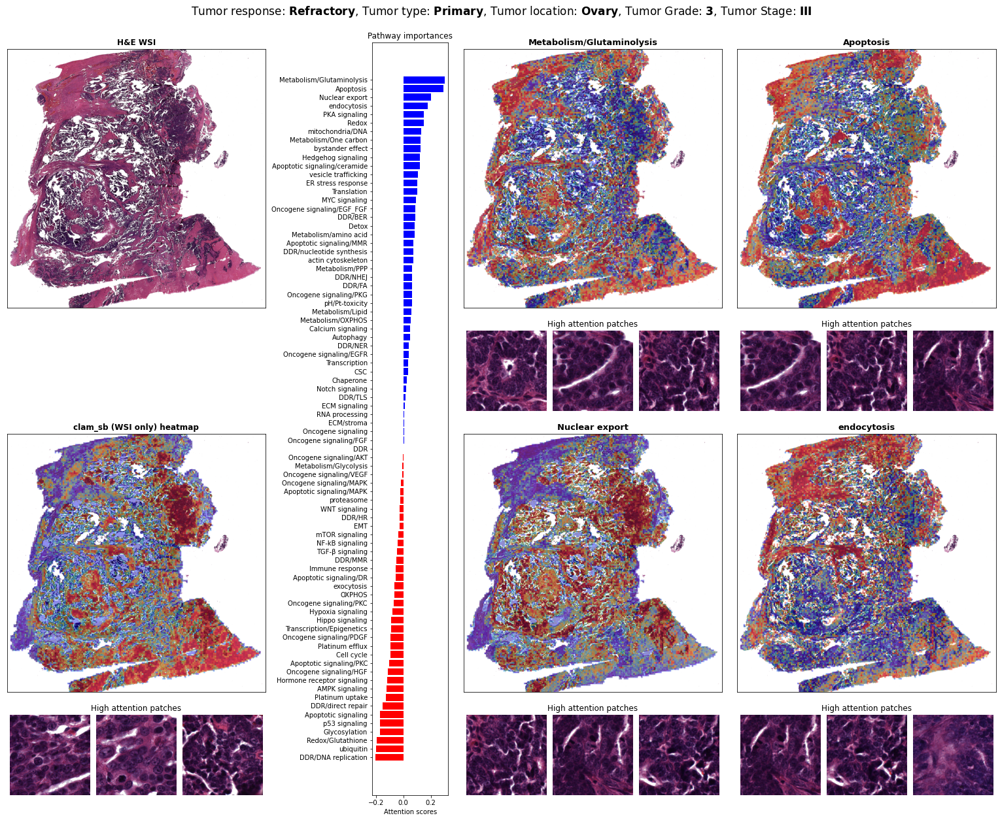

1009793_271271_ImageActual
15


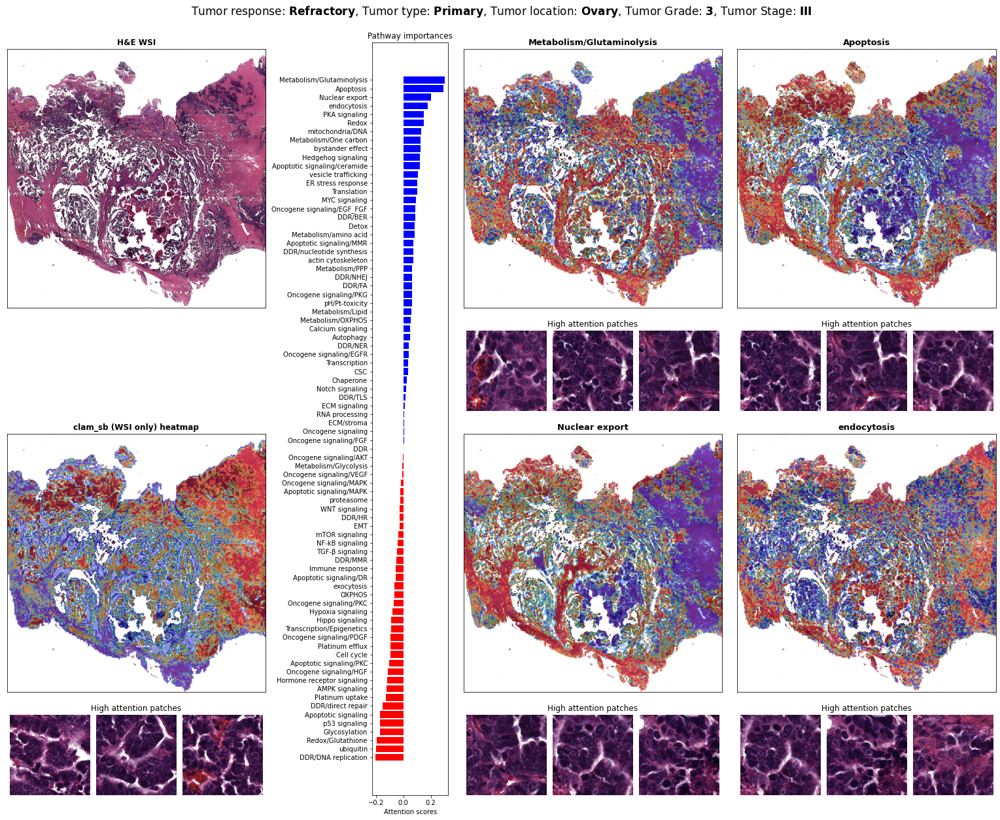

1009480_171144_ImageActual
15


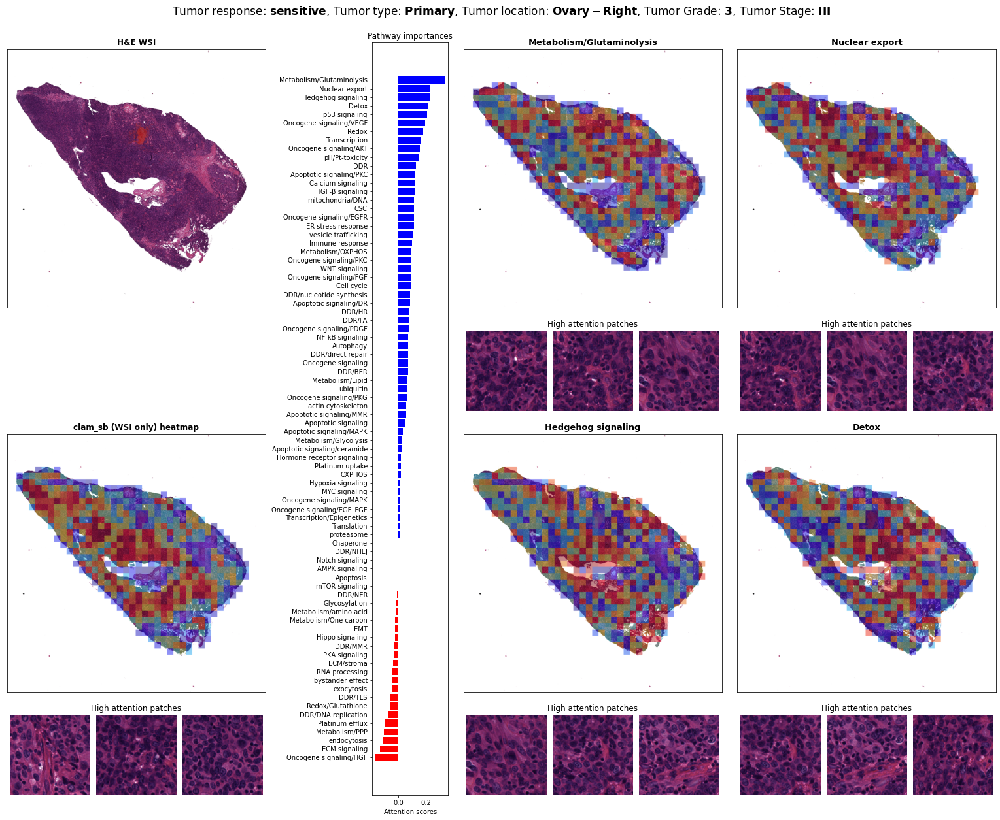

1009481_416637_ImageActual
15


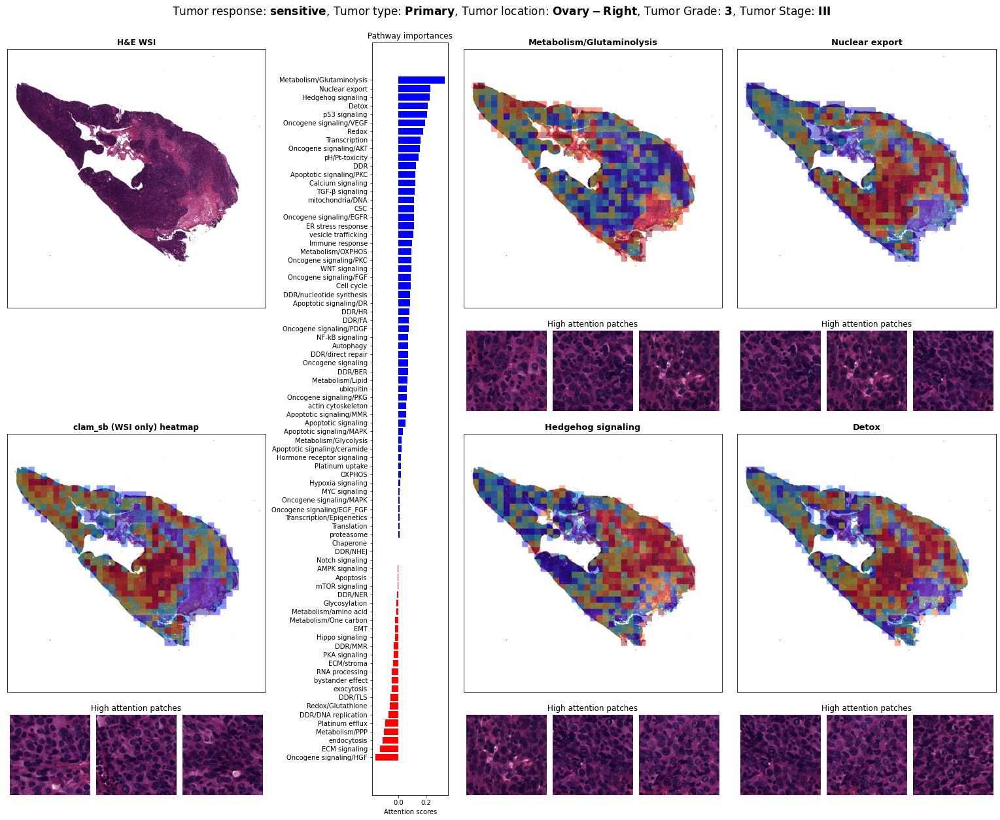

1009410_171036_ImageActual
15


In [6]:
# Make plit with layout of image and then heatmaps with patches.. get patches part to work...? 


def create_interpretatbility_fig(image):

    metadata = pd.read_excel("/mnt/ncshare/ozkilim/BRCA/data/HGSOC_processed_data/PTRC-HGSOC_List_clincal_data.xlsx")
    metadata = metadata.loc[metadata['File Name']==image]
    row_to_format = metadata.iloc[0]
    # Format the row for title
    formatted_title = format_row_for_title(row_to_format)
    # get matedata and decide what taches to show 

    # Set the path to the folder containing the images
    folder_path = '/mnt/ncshare/ozkilim/BRCA/heatmaps/IPS_pathways_heatmaps/heatmap_raw_results/HGSOC_MCAT_UAB_IPS_pathways/Unspecified' + image

    # Create a figure
    fig = plt.figure(figsize=(21, 16))
    # Define the grid layout
    gs = gridspec.GridSpec(8, 11, figure=fig)  # Example: 3 rows, 6 columns

#    # Iterate through GridSpec and create subplots
#     for i in range(gs.nrows):
#         for j in range(gs.ncols):
#             ax = fig.add_subplot(gs[i, j])
#             # Draw gridlines
#             ax.axhline(y=0, color='gray', linestyle='-', linewidth=0.5)
#             ax.axvline(x=0, color='gray', linestyle='-', linewidth=0.5)
#             # Turn off axis
#             ax.set_xticks([])
#             ax.set_yticks([])
    # plt.gca().set_aspect('equal', adjustable='box')
    # Make the top and right axis lines invisible

    # Create subplots
    ax1 = fig.add_subplot(gs[0:3, :3]) 
    ax2 = fig.add_subplot(gs[4:7, :3]) 
    ax2_patches = fig.add_subplot(gs[7, :3])

    ax3 = fig.add_subplot(gs[:, 4:5]) 

    ax5 = fig.add_subplot(gs[0:3, 5:8])
    ax5_patches = fig.add_subplot(gs[3, 5:8])

    ax6 = fig.add_subplot(gs[0:3, 8:])
    ax6_patches = fig.add_subplot(gs[3, 8:])

    ax7 = fig.add_subplot(gs[4:7, 5:8])
    ax7_patches = fig.add_subplot(gs[7, 5:8])

    ax8 = fig.add_subplot(gs[4:7, 8:])
    ax8_patches = fig.add_subplot(gs[7, 8:])

    # Show HandE
    H_and_E = get_single_png_file(folder_path)
    H_and_E = Image.open(H_and_E)
    H_and_E = crop_to_square(H_and_E, padding=30)
    ax1.imshow(H_and_E)
    # Show clam_sb heatmap baseline.
    clam_heatmap = get_clam_sb_heatmap(folder_path)
    clam_heatmap = Image.open(clam_heatmap)
    clam_heatmap = crop_to_square(clam_heatmap, padding=30)

    ax2.imshow(clam_heatmap)

    # plot patches  from heatmap of importance
    
    clam_patch_path = "/mnt/ncshare/ozkilim/BRCA/heatmaps/plat_responce_heatmaps/heatmap_production_results/HGSOC_clam_sb_MAYO_primary/sampled_patches/" # TODO: make dynaimc to pick correctly for pred
    clam_sb_patch_arrays = load_patch_png_images_walk(clam_patch_path,image)

    print(len(clam_sb_patch_arrays))

    inner_gs = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=ax2_patches,wspace=0, hspace=0)
    # Iterate through the inner grid and plot images
    for j in range(3):
        ax = fig.add_subplot(inner_gs[0, j])
        clam_image = crop_to_square(clam_sb_patch_arrays[j], padding=30)
        ax.imshow(clam_image)
        ax.axis('off')
        ax.set_xticks([])
        ax.set_yticks([])

    multimodal_folder_path = "/mnt/ncshare/ozkilim/BRCA/heatmaps/plat_responce_heatmaps/heatmap_raw_results/HGSOC_MCAT_Mayo_plat_resp_clusters/Unspecified/" + image
    # # Show pathways attentions.
    npy_file_path = find_first_npy_file(multimodal_folder_path)
    # npy_file_path = "/mnt/ncshare/ozkilim/BRCA/heatmaps/HGSOC_heatmaps/heatmap_raw_results/HGSOC_MCAT_Mayo_plat_resp_clusters/Unspecified/1009481_416637_ImageActual/omics_attns.npy"
    omics_attns = np.load(npy_file_path)
    values = omics_attns.copy()[0]
    sorted_indices = np.argsort(values)
    sorted_strings = np.array(multimodal_protein_groups)[sorted_indices]
    sorted_values = values[sorted_indices]
    sorted_values = sorted_values-0.4
    # Plotting each bar individually to assign colors
    for i in range(len(sorted_values)):
        color = 'blue' if sorted_values[i] > 0 else 'red'
        ax3.barh(sorted_strings[i], sorted_values[i], color=color)
    # Set labels and title if necessary
    ax3.set_xlabel('Attention scores')
    ax3.set_title('Pathway importances')


    #### Plot co-attention heatmaps. #####
    # one by one... 
    mutlimodal_heatmap_paths = get_cross_attns(multimodal_folder_path)
    axes = [ax5,ax6,ax7,ax8]
    patch_axes = [ax5_patches,ax6_patches,ax7_patches,ax8_patches]
 
    # pathes_multimodal = clam_patch_path #TODO: change to actual patches for that channel
    # patch_arrays = load_patch_png_images(pathes_multimodal,image, num_images=12) # only 4...
    patch_arrays = clam_sb_patch_arrays.copy()[3:]
    for idx,(axis,patch_axis) in enumerate(zip(axes,patch_axes)):

        # Order by pathway importance and dynamically show the heatmap for the most important pathway. 
        highest_channel = sorted_indices[-idx-1]
        pathway = sorted_strings[-idx-1]
        mutlimodal_heatmap = Image.open(mutlimodal_heatmap_paths[highest_channel])
        mutlimodal_heatmap = crop_to_square(mutlimodal_heatmap, padding=30)
        axis.imshow(mutlimodal_heatmap)
        #todo audo select heatmap nd give title.
        axis.set_title(pathway,fontsize=13,weight='bold')
        inner_gs = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=patch_axis,wspace=0, hspace=0)
        # Iterate through the inner grid and plot images
        for j in range(3):
            ax = fig.add_subplot(inner_gs[0, j])
            multimodal_heatmap = crop_to_square(patch_arrays[idx+j], padding=30)
            ax.imshow(multimodal_heatmap)
            ax.axis('off')
            ax.set_xticks([])
            ax.set_yticks([])

        patch_axis.set_title("High attention patches")

        patch_axis.axis('off') 
        patch_axis.set_xticks([])
        patch_axis.set_yticks([])

        # axis.axis('off') 
        axis.set_xticks([])
        axis.set_yticks([])


    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_title("H&E WSI",weight='bold')

    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2_patches.axis('off') 
    ax2.set_title("clam_sb (WSI only) heatmap",weight='bold')
    ax2_patches.set_title("High attention patches")

    plt.suptitle(formatted_title, y=1.05, fontsize=17)

    # Heatmaps box.
    # x0 = 0.535
    # y0 = 0.14
    # width = 0.35
    # height = 0.737
    # # Create a rectangle with rounded corners
    # panel = patches.FancyBboxPatch((x0, y0), width, height, boxstyle="round,pad=0.015", ec="none", fc=(0.8, 0.2, 1, 0.1), transform=fig.transFigure, zorder=-1)
    # # Add the rectangle to the figure, behind the axis
    # fig.patches.append(panel)

    # # WSI box.
    # x0 = 0.137
    # y0 = 0.14
    # width = 0.16
    # height = 0.737
    # # Create a rectangle with rounded corners
    # panel = patches.FancyBboxPatch((x0, y0), width, height, boxstyle="round,pad=0.015", ec="none", fc=(0.8, 0.2, 1, 0.1), transform=fig.transFigure, zorder=-1)
    # # Add the rectangle to the figure, behind the axis
    # fig.patches.append(panel)

    plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0.2, hspace=0.2)
    fig.patch.set_facecolor('white')  # Set the background color of the figure to white
    output_filepath = "/mnt/ncshare/ozkilim/BRCA/figures/intepretability" + image + ".png"
    plt.savefig(output_filepath, bbox_inches='tight', dpi=300, facecolor=fig.get_facecolor())  # Save with high resolution
    plt.show()


# metastatic
# image = "1009512_171142_ImageActual"
# image = '1009438_171128_ImageActual'
# create_interpretatbility_fig(image)
# image = '1009623_269132_ImageActual'
# create_interpretatbility_fig(image)
# image = '1009835_271288_ImageActual'
# create_interpretatbility_fig(image)


proc_list = pd.read_csv("/mnt/ncshare/ozkilim/BRCA/HGSOC_platinum_responce/process_lists/HGSOC_MAYO_hold_out_Primary_process_list.csv") #174
images = proc_list['slide_id'].to_list()

for image in images:
    # try:
    print(image)
    create_interpretatbility_fig(image)
    # except:
    #     pass
# loop over entire proc list... then pick best .... 

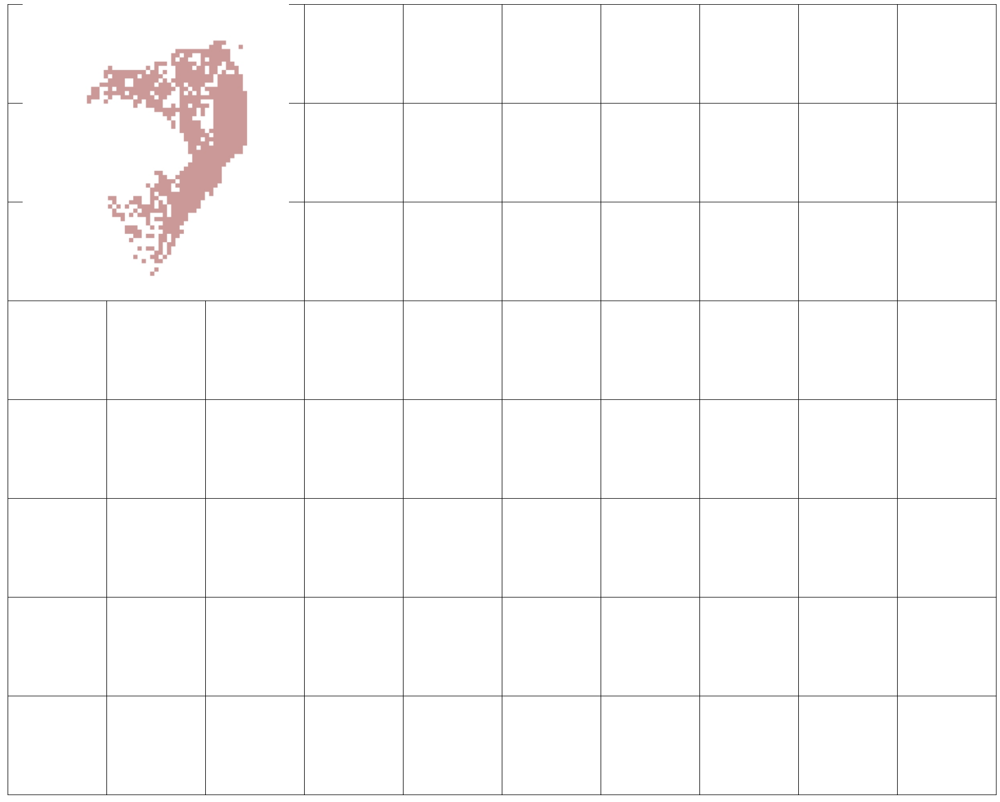

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import numpy as np

fig = plt.figure(figsize=(20, 16))
gs = gridspec.GridSpec(8, 10, figure=fig, wspace=0, hspace=0)  # Set wspace and hspace to 0

# Load your image
img = Image.open('/mnt/ncshare/ozkilim/BRCA/heatmaps/HGSOC_heatmaps/heatmap_production_results/HGSOC_clm_sb/Unspecified/1009404_171121_ImageActual_1.0_roi_0_blur_1_rs_1_bc_1_a_0.4_l_-1_bi_1_-1.0.jpg')  # Update the path to your image
img_array = np.array(img)

# Iterate through GridSpec and create subplots
for i in range(gs.nrows):
    for j in range(gs.ncols):
        ax = fig.add_subplot(gs[i, j])
        # Draw gridlines
        ax.axhline(y=0, color='gray', linestyle='-', linewidth=0.5)
        ax.axvline(x=0, color='gray', linestyle='-', linewidth=0.5)
        # Turn off axis
        ax.set_xticks([])
        ax.set_yticks([])

        # Display the image in a specific subplot, for example, at position (0,0)
        # if i == 0 and j == 0:

ax = fig.add_subplot(gs[0:3, 0:3])

ax.imshow(img_array)
ax.axis('off')  # Turn off axis for the image

# Adjust subplot spacings
plt.subplots_adjust(left=0, right=1, top=1, bottom=0, wspace=0, hspace=0)

plt.show()

In [3]:
# Create sub maps for proteomics feature attribuitions for groups..., load .pt file and unpack... 
import torch 

igs = torch.load("/mnt/ncshare/ozkilim/BRCA/heatmaps/plat_responce_heatmaps/heatmap_raw_results/HGSOC_MCAT_Mayo_plat_resp_clusters/Unspecified/1009466_171125_ImageActual/attributions_ig.pt")
igs=igs[1:]

igs[0].shape
# pick highest index thne pick some prots to plot out improtances...
# specifically for DNA repair pathway as general... 

torch.Size([67])

In [35]:
print(protein_categories.keys())
key_name = "p53 signaling"
index = list(protein_categories.keys()).index(key_name)
print(index)
protein_categories["p53 signaling"]

dict_keys(['Apoptotic signaling', 'DDR', 'p53 signaling', 'Platinum efflux', 'PKA signaling', 'Oncogene signaling', 'Metabolism/Lipid', 'Metabolism/OXPHOS', 'Transcription/Epigenetics', 'ECM/stroma', 'ECM signaling', 'EMT', 'WNT signaling', 'NF-kB signaling', 'Notch signaling', 'Immune response', 'Detox', 'Apoptosis', 'Redox', 'AMPK signaling', 'mTOR signaling', 'CSC', 'Metabolism/Glycolysis', 'Cell cycle', 'DDR/direct repair', 'Autophagy', 'Oncogene signaling/MAPK', 'Calcium signaling', 'DDR/BER', 'Translation', 'Redox/Glutathione', 'Hypoxia signaling', 'DDR/nucleotide synthesis', 'Metabolism/amino acid', 'Oncogene signaling/PKG', 'Platinum uptake', 'pH/Pt-toxicity', 'Oncogene signaling/AKT', 'ubiquitin', 'DDR/HR', 'MYC signaling', 'DDR/NER', 'ER stress response', 'TGF-β signaling', 'Chaperone', 'Hippo signaling', 'Transcription', 'DDR/DNA replication', 'vesicle trafficking', 'Hormone receptor signaling', 'Oncogene signaling/EGFR', 'Metabolism/One carbon', 'RNA processing', 'Apoptotic

['AATF',
 'ANXA2',
 'AURKA',
 'BCL2L1',
 'CASP6',
 'CASP7',
 'CDKN2A',
 'DAPK1',
 'DAXX',
 'EP300',
 'HSPA5',
 'KDM3A',
 'KDM5A',
 'LRP1',
 'MNAT1',
 'NPM1',
 'PARK7',
 'PHB',
 'RPL37',
 'RPS20',
 'S100B',
 'SFN',
 'SHC1',
 'SIRT1',
 'TAB1',
 'TP53',
 'TPT1',
 'VHL',
 'XPO1']

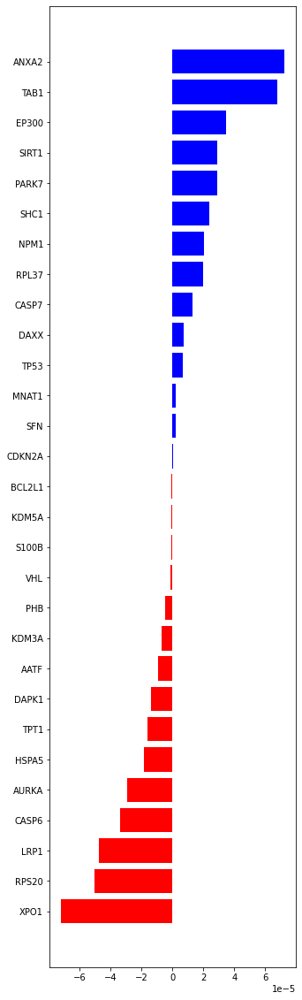

In [36]:

fig = plt.figure(figsize=(5, 20))

first = igs[index]
first_prots = list(protein_categories.values())[index]
# sort : 
sorted_indices = np.argsort(first.cpu())
sorted_strings = np.array(first_prots)[sorted_indices]
sorted_values = first[sorted_indices]
# Plotting each bar individually to assign colors
for i in range(len(sorted_strings)):
    color = 'blue' if sorted_values[i] > 0 else 'red'
    plt.barh(sorted_strings[i], sorted_values[i], color=color)
# Set labels and title if necessary
# ax3.set_xlabel('integrated gradient')
# ax3.set_title('integrated gradients')
    

#TODO make aggregated plot  of patways and prots over all cohorts...
# TODO: compare this to defines up/ down regulated in plat resp groups.